In [ ]:
import os
import gc
import sys
import random
import pickle

import pandas as pd
import numpy as np

import tensorflow as tf
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.preprocessing import image
from tensorflow.keras.layers import (
    Input, Dense, Activation, Dropout, Flatten, BatchNormalization,
    Conv2D, MaxPooling2D, AveragePooling2D, GlobalAveragePooling2D
)
from tensorflow.keras.applications import VGG19, ResNet50
from tensorflow.keras.applications.imagenet_utils import preprocess_input

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns
from livelossplot import PlotLossesKeras

from skimage.feature import hog, canny
from skimage.filters import sobel
from skimage import color

from sklearn.preprocessing import LabelEncoder, OneHotEncoder
from sklearn.model_selection import train_test_split

from PIL import Image
import cv2

from tf_explain.core.activations import ExtractActivations
from tf_explain.core.grad_cam import GradCAM

from tensorflow.keras.utils import get_file
from keras.preprocessing.image import ImageDataGenerator

%matplotlib inline

In [3]:
# Paths to dataset directories
BASE_PATH = r'P:/1-uni/machine-learning/Grapevine_Leaves_Image_Dataset'
PATH_AK = os.path.join(BASE_PATH, 'Ak')
PATH_ALA_IDRIS = os.path.join(BASE_PATH, 'Ala_Idris')
PATH_BUZGULU = os.path.join(BASE_PATH, 'Buzgulu')
PATH_DIMNIT = os.path.join(BASE_PATH, 'Dimnit')
PATH_NAZLI = os.path.join(BASE_PATH, 'Nazli')

In [39]:
# Initialize an empty DataFrame
data_df = pd.DataFrame()

# Combine image file names from all directories into a single list
data_df['image_names'] = (
    os.listdir(PATH_AK) 
    + os.listdir(PATH_ALA_IDRIS) 
    + os.listdir(PATH_BUZGULU) 
    + os.listdir(PATH_DIMNIT) 
    + os.listdir(PATH_NAZLI)
)

In [39]:
# Display the first 5 image names
data_df['image_names'].head()

In [39]:
# Extract class labels and file paths
class_labels = []
file_paths = []

In [39]:
for img_name in data_df['image_names']:
    label = img_name.split(' (')[0]  # Extract the class label from the file name
    class_labels.append(label)
    file_paths.append(os.path.join(BASE_PATH, label, img_name))  # Construct the full file path

# Add class labels and file paths to the DataFrame
data_df['class_labels'] = class_labels
data_df['file_paths'] = file_paths

# Display the first few rows of the DataFrame
data_df.head()

# Check for missing values
missing_values = data_df.isna().sum()
print("Missing Values:\n", missing_values)

# Print the number of unique classes
unique_classes = len(data_df['class_labels'].value_counts())
print('Number of Unique Leaf Classes:', unique_classes)

In [39]:
class_distribution = data_df['class_labels'].value_counts()
print("Class Distribution:\n", class_distribution)

sns.set_theme(style="whitegrid", palette="pastel", font="serif")
sns.set(rc={'figure.figsize': (15, 12)})

dist_plot = sns.countplot(x=data_df['class_labels'], color='#1f77b4')

# Customizing
dist_plot.set_title('Distribution of Leaf Classes\n', fontsize=20, fontweight='bold', pad=20)
dist_plot.set_ylabel('Count', fontsize=15, labelpad=10)
dist_plot.set_xlabel('Leaf Classes', fontsize=15, labelpad=10)

# Annotate bar counts
for bar in dist_plot.patches:
    count = int(bar.get_height())
    dist_plot.annotate(
        f'{count}', 
        (bar.get_x() + bar.get_width() / 2, bar.get_height()), 
        ha='center', va='center', 
        xytext=(0, 8), 
        textcoords='offset points', 
        fontsize=12
    )

# Remove top and right spines for a cleaner look
sns.despine()

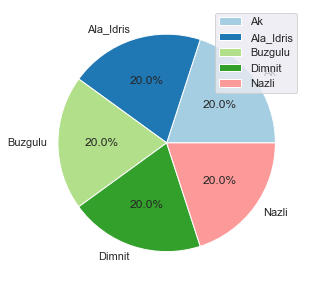

In [40]:
#اضافی
plt.figure(figsize=(5,5))
class_cnt = main_df.groupby(['classes']).size().reset_index(name = 'counts')
colors = sns.color_palette('Paired')[0:9]
plt.pie(class_cnt['counts'], labels=class_cnt['classes'], colors=colors, autopct='%1.1f%%')
plt.legend(loc='upper right')
plt.show()

['Ak' 'Ala_Idris' 'Buzgulu' 'Dimnit' 'Nazli']


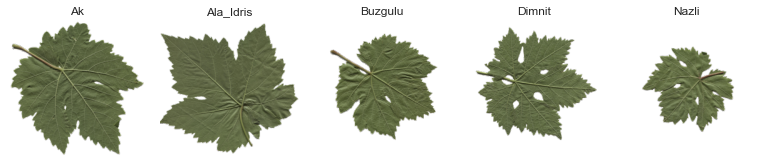

In [41]:
plt.figure(figsize = (15,15))
print(main_df.classes.unique())
for idx,i in enumerate(main_df.classes.unique()):
    plt.subplot(4,7,idx+1)
    df = main_df[main_df['classes'] ==i].reset_index(drop = True)
    image_path = df.loc[rnd.randint(0, len(df))-1,'path']
    img = Image.open(image_path)
    img = img.resize((224,224))
    plt.imshow(img)
    plt.axis('off')
    plt.title(i)
plt.tight_layout()
plt.show()

In [42]:
def plot_species(df,leave_name):
    plt.figure(figsize = (12,12))
    species_df = df[df['classes'] == leave_name].reset_index(drop = True)
    plt.suptitle(leave_name)
    for idx,i in enumerate(np.random.choice(species_df['path'],32)):
        plt.subplot(8,8,idx+1)
        image_path = i
        img = Image.open(image_path)
        img = img.resize((224,224))
        plt.imshow(img)
        plt.axis('off')
    plt.tight_layout()
    plt.show()

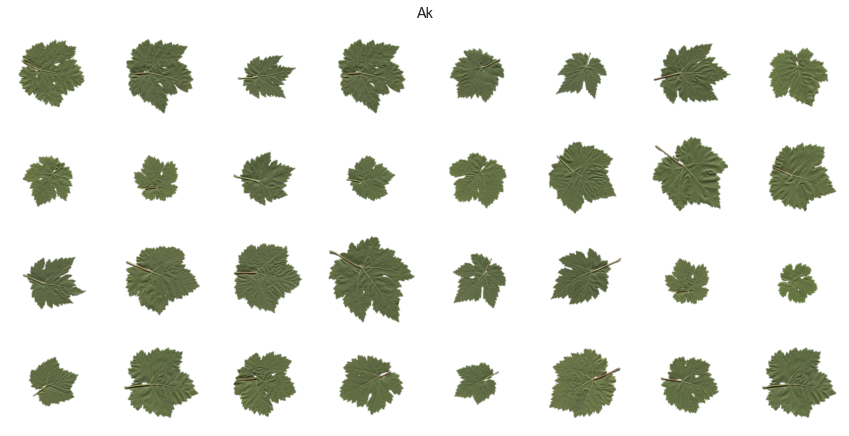

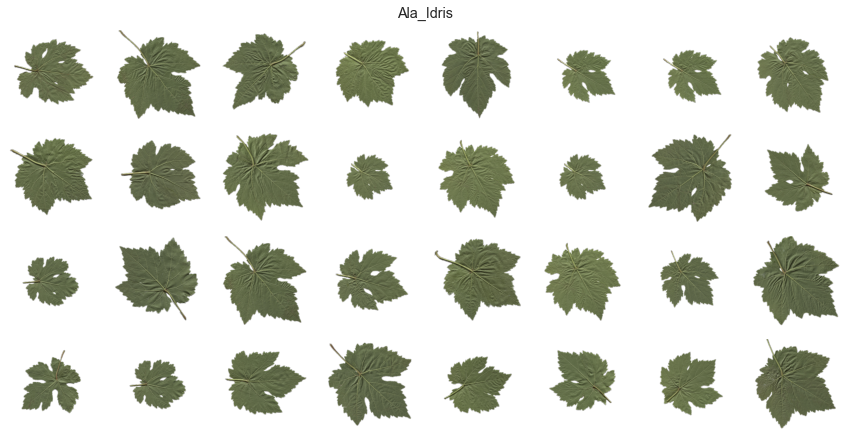

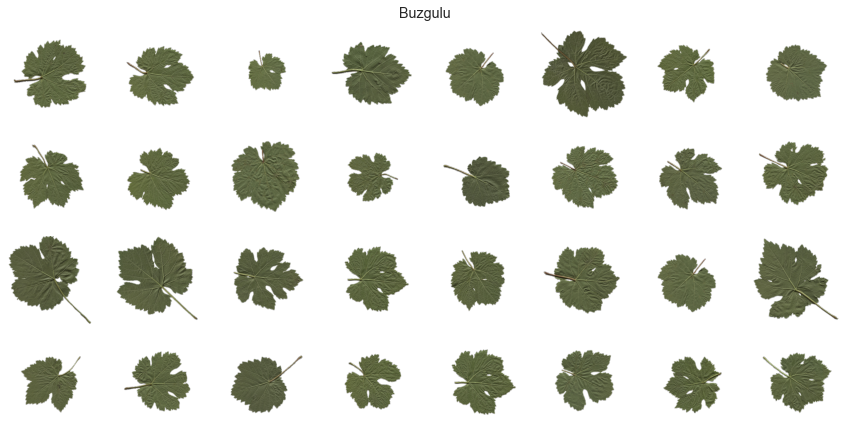

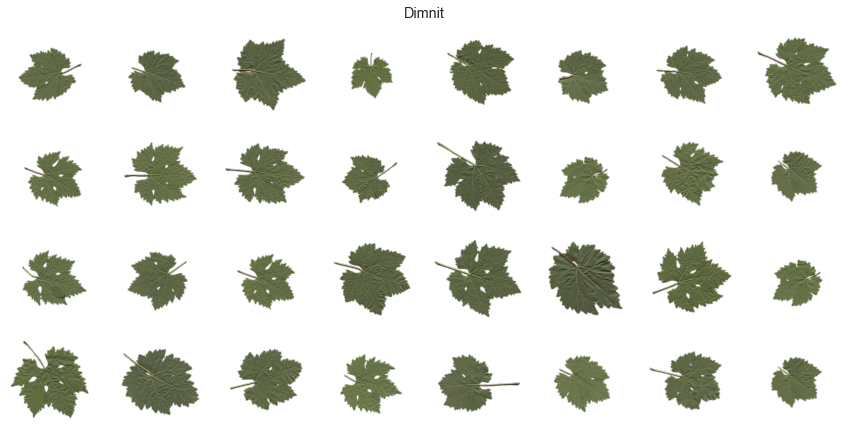

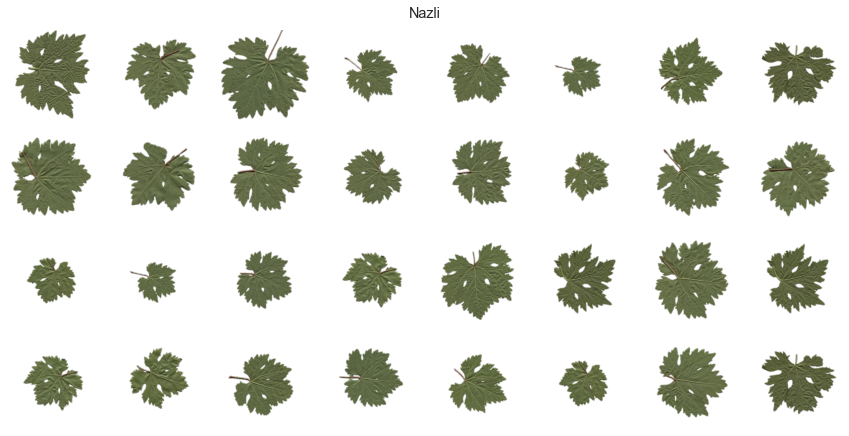

In [43]:
for leave_name in main_df['classes'].unique():
    plot_species(main_df , leave_name)

In [44]:
widths, heights = [], []

for path in tqdm(main_df["path"]):
    width, height = Image.open(path).size
    widths.append(width)
    heights.append(height)

main_df["width"] = widths
main_df["height"] = heights
main_df["dimension"] = main_df["width"] * main_df["height"]

100%|██████████████████████████████████████████████████████████████████████████████| 500/500 [00:00<00:00, 1495.09it/s]


In [45]:
main_df.sort_values('width').head(84)

,images,classes,path,width,height,dimension
0,Ak (1).png,Ak,G:\1-uni\project\Grapevine_Leaves_Image_Datase...,511,511,261121
341,Dimnit (46).png,Dimnit,G:\1-uni\project\Grapevine_Leaves_Image_Datase...,511,511,261121
340,Dimnit (45).png,Dimnit,G:\1-uni\project\Grapevine_Leaves_Image_Datase...,511,511,261121
339,Dimnit (44).png,Dimnit,G:\1-uni\project\Grapevine_Leaves_Image_Datase...,511,511,261121
338,Dimnit (43).png,Dimnit,G:\1-uni\project\Grapevine_Leaves_Image_Datase...,511,511,261121
...,...,...,...,...,...,...
262,Buzgulu (65).png,Buzgulu,G:\1-uni\project\Grapevine_Leaves_Image_Datase...,511,511,261121
261,Buzgulu (64).png,Buzgulu,G:\1-uni\project\Grapevine_Leaves_Image_Datase...,511,511,261121
260,Buzgulu (63).png,Buzgulu,G:\1-uni\project\Grapevine_Leaves_Image_Datase...,511,511,261121
259,Buzgulu (62).png,Buzgulu,G:\1-uni\project\Grapevine_Leaves_Image_Datase...,511,511,261121


In [46]:
main_df.sort_values('width').tail(84)

,images,classes,path,width,height,dimension
238,Buzgulu (43).png,Buzgulu,G:\1-uni\project\Grapevine_Leaves_Image_Datase...,511,511,261121
237,Buzgulu (42).png,Buzgulu,G:\1-uni\project\Grapevine_Leaves_Image_Datase...,511,511,261121
236,Buzgulu (41).png,Buzgulu,G:\1-uni\project\Grapevine_Leaves_Image_Datase...,511,511,261121
235,Buzgulu (40).png,Buzgulu,G:\1-uni\project\Grapevine_Leaves_Image_Datase...,511,511,261121
188,Ala_Idris (89).png,Ala_Idris,G:\1-uni\project\Grapevine_Leaves_Image_Datase...,511,511,261121
...,...,...,...,...,...,...
159,Ala_Idris (62).png,Ala_Idris,G:\1-uni\project\Grapevine_Leaves_Image_Datase...,511,511,261121
158,Ala_Idris (61).png,Ala_Idris,G:\1-uni\project\Grapevine_Leaves_Image_Datase...,511,511,261121
157,Ala_Idris (60).png,Ala_Idris,G:\1-uni\project\Grapevine_Leaves_Image_Datase...,511,511,261121
170,Ala_Idris (72).png,Ala_Idris,G:\1-uni\project\Grapevine_Leaves_Image_Datase...,511,511,261121


In [47]:
main_df.mean()

C:\Users\win10\AppData\Local\Temp/ipykernel_18044/1233638786.py:1: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  main_df.mean()


width           511.0
height          511.0
dimension    261121.0
dtype: float64

In [48]:
def is_grey_scale(givenImage):
    w,h = givenImage.size
    for i in range(w):
        for j in range(h):
            r,g,b = givenImage.getpixel((i,j))
            if r != g != b: return False
    return True

In [49]:
sampleFrac = 0.5
#get our sampled images
isGreyList = []
for imageName in main_df['path'].sample(frac=sampleFrac):
    val = Image.open(imageName).convert('RGB')
    isGreyList.append(is_grey_scale(val))
print(np.sum(isGreyList) / len(isGreyList))
del isGreyList

0.0


In [50]:
def get_rgb_men(row):
    img = cv2.imread(row['path'])
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    return np.sum(img[:,:,0]), np.sum(img[:,:,1]), np.sum(img[:,:,2])

tqdm.pandas()
main_df['R'], main_df['G'], main_df['B'] = zip(*main_df.progress_apply(lambda row: get_rgb_men(row), axis=1))

100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:08<00:00, 57.56it/s]


In [52]:
def edges_images_gray(class_name):
    classes_df = main_df[main_df['classes'] ==  class_name].reset_index(drop = True)
    for idx,i in enumerate(np.random.choice(main_df['path'],4)):
        image = cv2.imread(i)
        gray=cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        edges = sobel(image)
        gray_edges=canny(gray)
        dimension = edges.shape
        fig = plt.figure(figsize=(8, 8))
        plt.suptitle(class_name)
        plt.subplot(2,2,1)
        plt.imshow(gray_edges) #, !!!!!!!!!!!!cmap='gray')
        plt.subplot(2,2,2)
        plt.imshow(edges[:dimension[0],:dimension[1],0], cmap="gray")
        plt.subplot(2,2,3)
        plt.imshow(edges[:dimension[0],:dimension[1],1], cmap='gray')
        plt.subplot(2,2,4)
        plt.imshow(edges[:dimension[0],:dimension[1],2], cmap='gray')
        plt.show()

In [53]:
def edges_images_white(class_name):
    classes_df = main_df[main_df['classes'] ==  class_name].reset_index(drop = True)
    for idx,i in enumerate(np.random.choice(main_df['path'],4)):
        image = cv2.imread(i)
        gray=cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        edges = sobel(image)
        gray_edges=canny(gray)
        dimension = edges.shape
        fig = plt.figure(figsize=(8, 8))
        plt.suptitle(class_name)
        plt.subplot(2,2,1)
        plt.imshow(gray_edges)
        plt.subplot(2,2,2)
        plt.imshow(edges[:dimension[0],:dimension[1],0], cmap="BuGn")
        plt.subplot(2,2,3)
        plt.imshow(edges[:dimension[0],:dimension[1],1], cmap='BuGn')
        plt.subplot(2,2,4)
        plt.imshow(edges[:dimension[0],:dimension[1],2], cmap='BuGn')
        plt.show()
        "https://www.bogotobogo.com/python/OpenCV_Python/python_opencv3_Image_Gradient_Sobel_Laplacian_Derivatives_Edge_Detection.php"

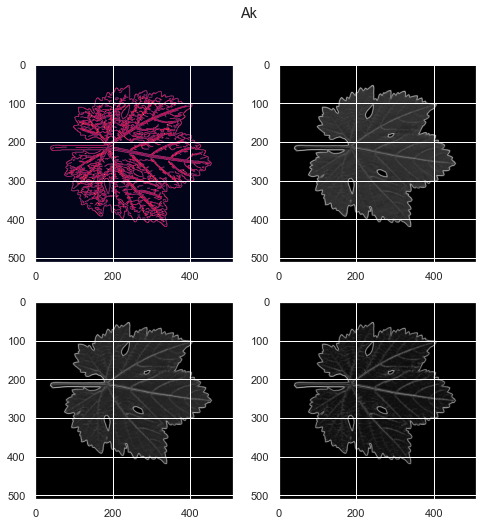

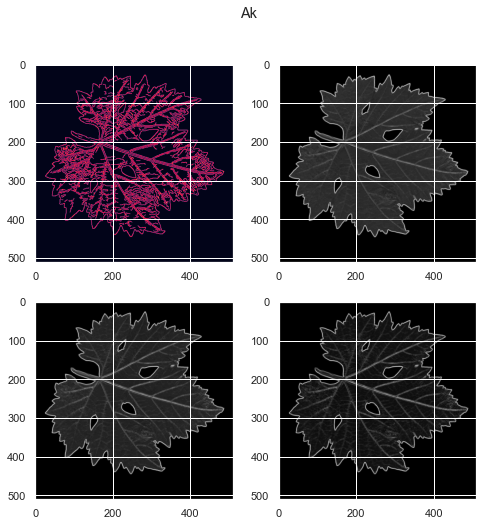

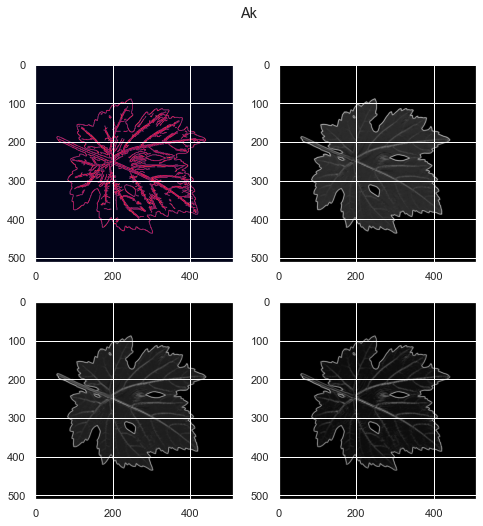

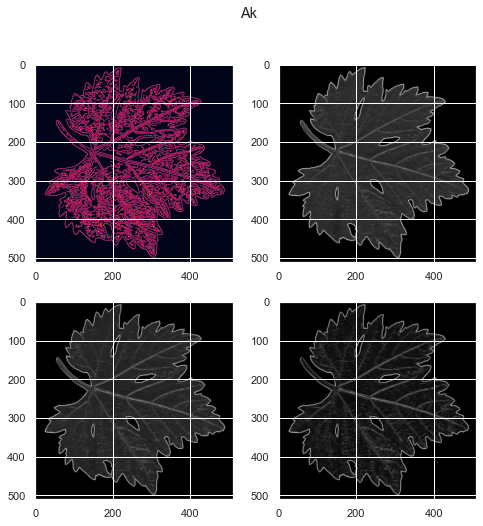

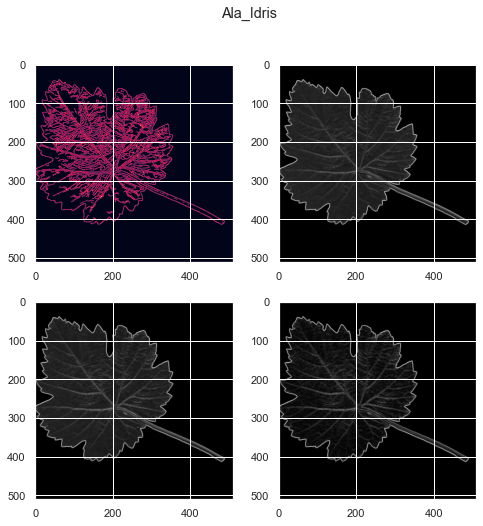

...

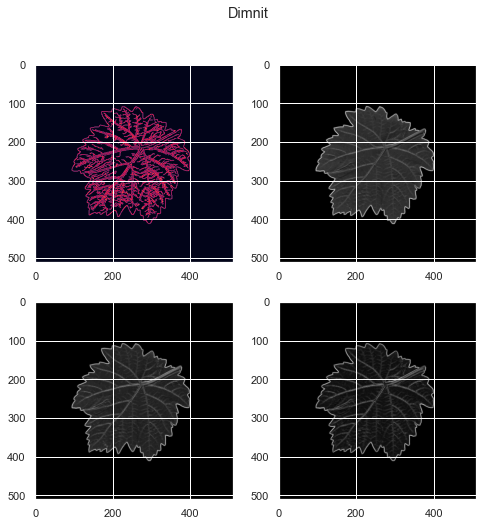

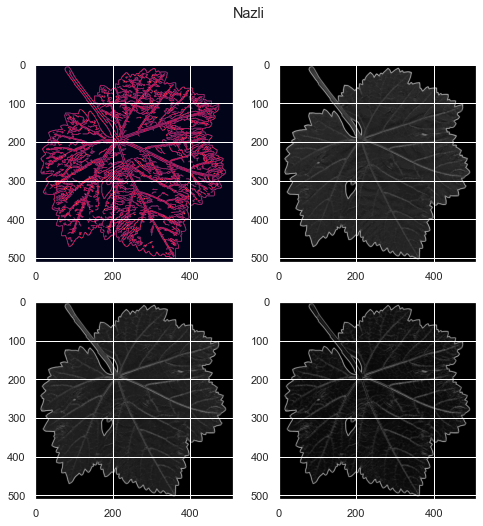

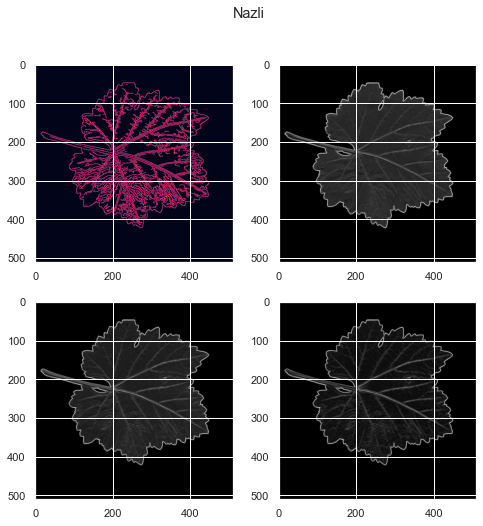

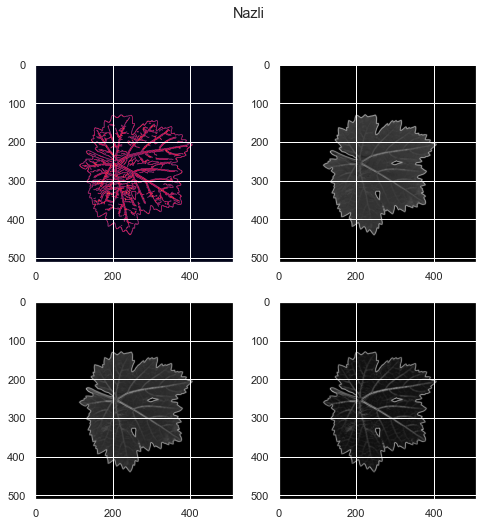

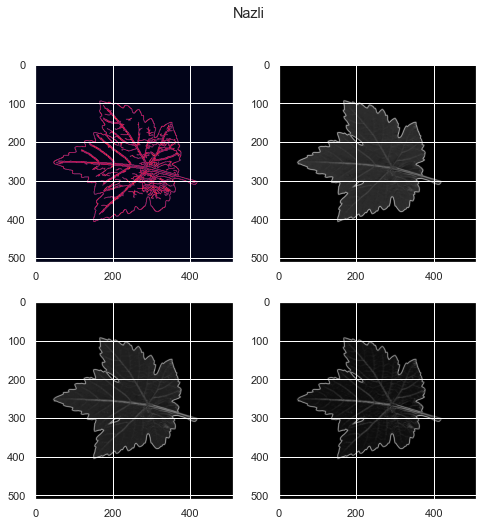

In [54]:
for class_name in main_df['classes'].unique():
    edges_images_gray(class_name)

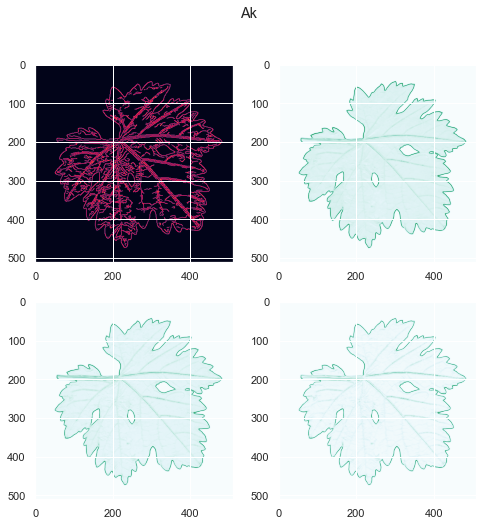

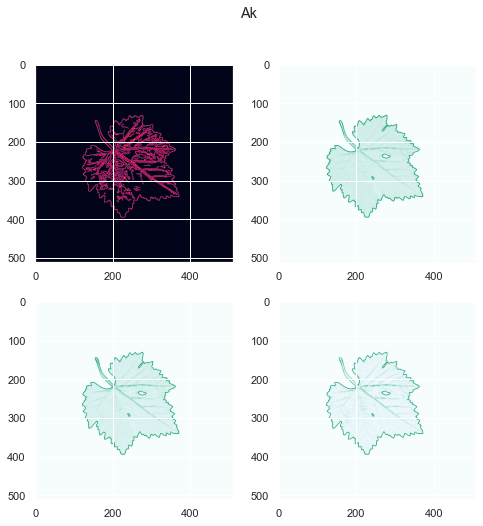

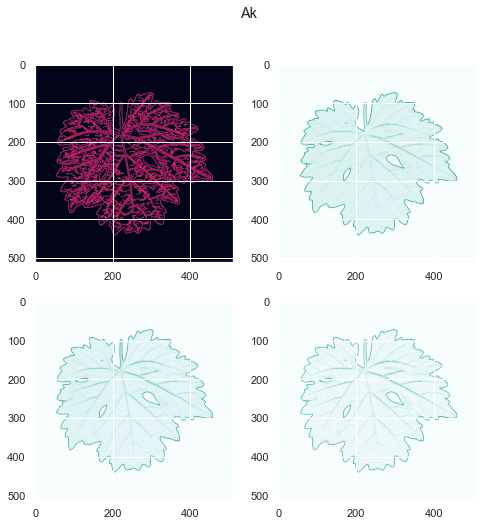

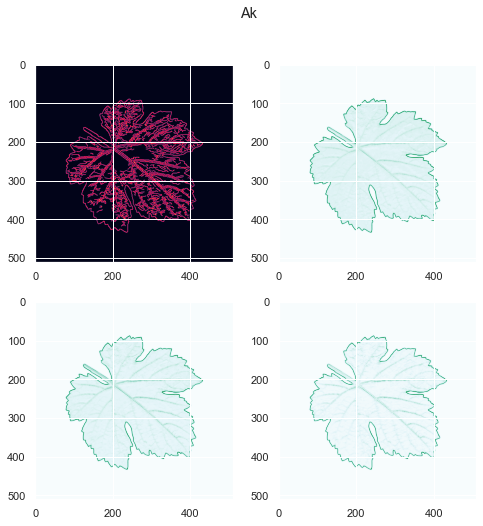

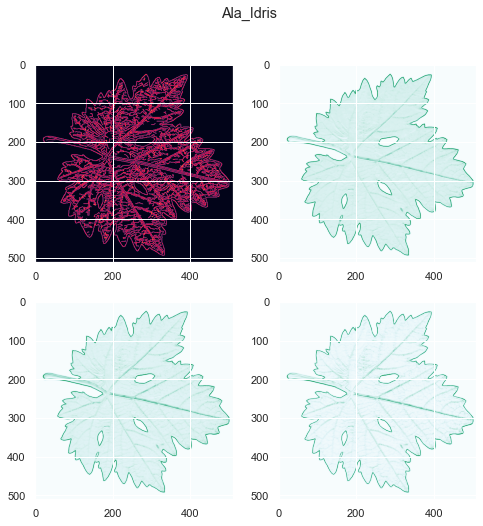

...

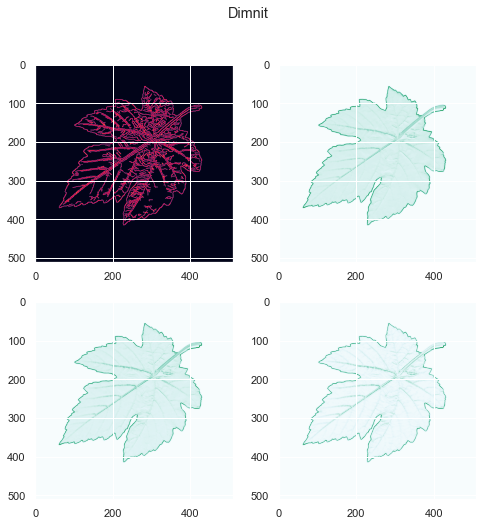

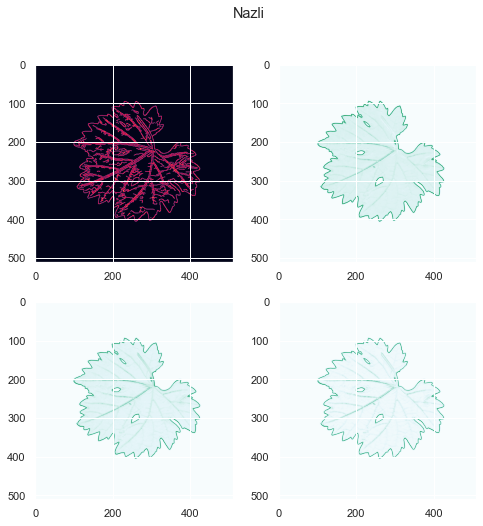

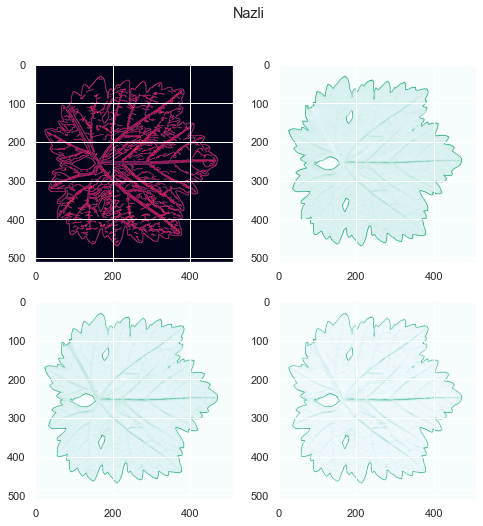

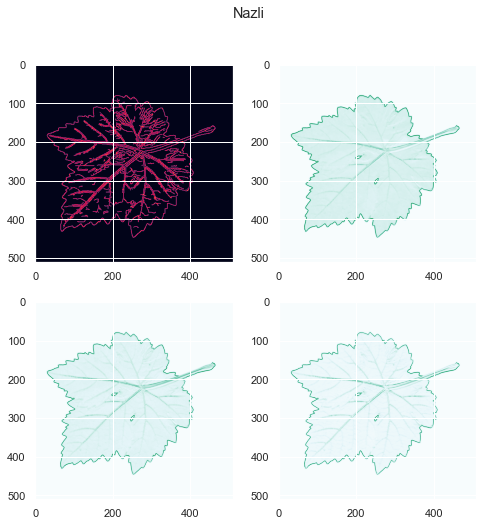

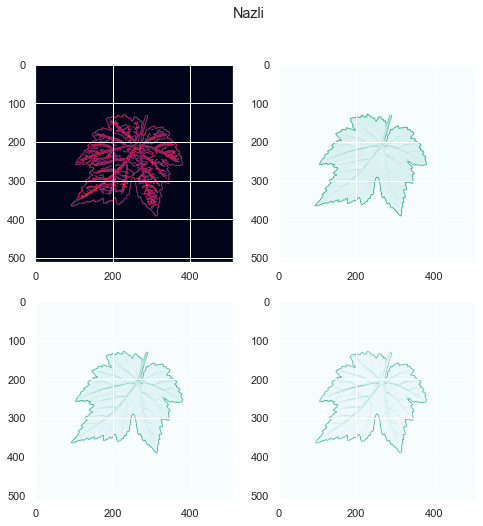

In [55]:
for class_name in main_df['classes'].unique():
    edges_images_white(class_name)

In [56]:
def corners_images_gray(class_name):
    classes_df = main_df[main_df['classes'] ==  class_name].reset_index(drop = True)
    for idx,i in enumerate(np.random.choice(main_df['path'],4)):
        image = cv2.imread(i)
        gray=cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        corners_gray = cv2.goodFeaturesToTrack(gray, maxCorners=50, qualityLevel=0.02, minDistance=20)
        corners_gray = np.float32(corners_gray)
        for item in corners_gray:
            x, y = item[0]
            cv2.circle(image, (int(x), int(y)), 6, (0, 255, 0), -1)
        fig = plt.figure(figsize=(8, 8))
        plt.suptitle(class_name)
        plt.subplot(2,2,1)
        plt.imshow(image, cmap="BuGn")
        plt.show()

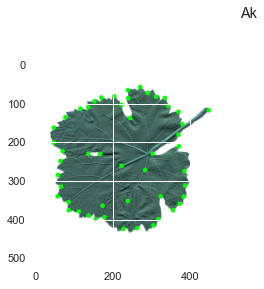

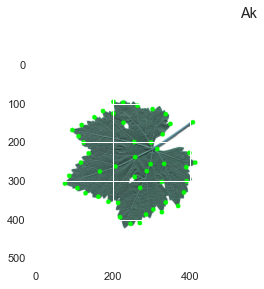

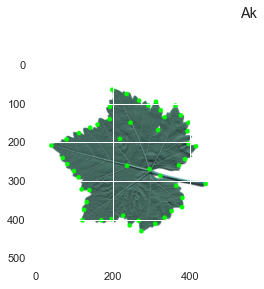

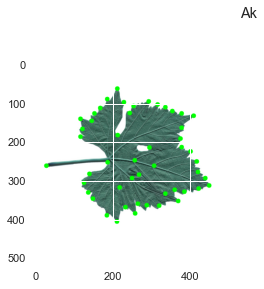

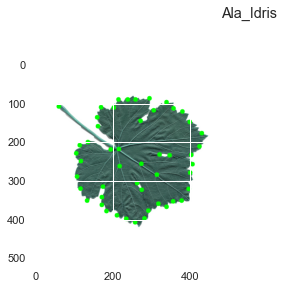

...

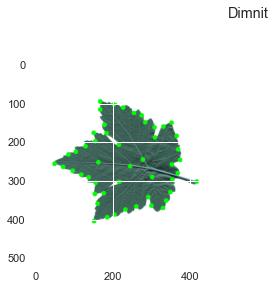

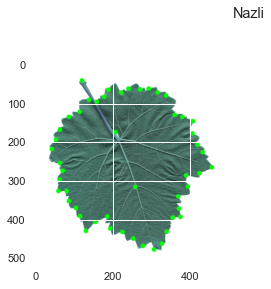

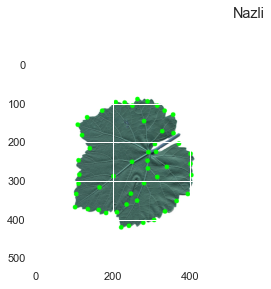

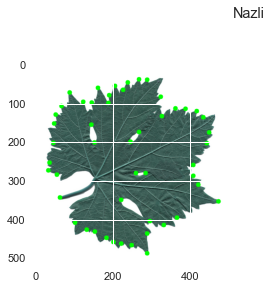

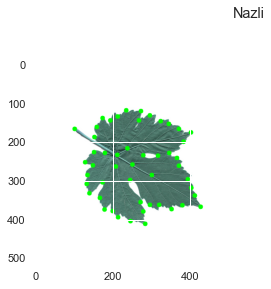

In [57]:
for class_name in main_df['classes'].unique():
    corners_images_gray(class_name)

In [58]:
def plot_augimages(paths, datagen):
    plt.figure(figsize = (14,28))
    plt.suptitle('Augmented Images')
    
    midx = 0
    for path in paths:
        data = Image.open(path)
        data = data.resize((224,224))
        samples = expand_dims(data, 0)
        it = datagen.flow(samples, batch_size=1)
    
        # Show Original Image
        plt.subplot(10,5, midx+1)
        plt.imshow(data)
        plt.axis('off')
            
        # Show Augmented Images
        for idx, i in enumerate(range(4)):
            midx += 1
            plt.subplot(10,5, midx+1)
            
            batch = it.next()
            image = batch[0].astype('uint8')
            plt.imshow(image)
            plt.axis('off')
        midx += 1
    
    plt.tight_layout()
    plt.show()

In [59]:
X_train, X_val, y_train, y_val = train_test_split(main_df[['path', 'classes']], main_df[['classes']], test_size=0.2, random_state=42)

In [60]:
from keras.applications.vgg19 import preprocess_input

In [61]:
vgg_datagen = ImageDataGenerator(
    rotation_range=20,
    zoom_range=0.10,
    brightness_range=[0.6,1.4],
    channel_shift_range=0.7,
    width_shift_range=0.15,
    height_shift_range=0.15,
    shear_range=0.15,
    horizontal_flip=True,
    fill_mode='nearest',
    preprocessing_function=preprocess_input
) 

train_generator_vgg = vgg_datagen.flow_from_dataframe(
        X_train,  # This is the source directory for training images
        x_col='path',
        y_col='classes',
        target_size=(227, 227),  # All images will be resized to 150x150
        batch_size=32,
        class_mode="categorical",
        shuffle=True,
)
val_generator_vgg = vgg_datagen.flow_from_dataframe(
        X_val,  # This is the source directory for training images
        x_col='path',
        y_col='classes',
        target_size=(227, 227),  # All images will be resized to 150x150
        batch_size=32,
        class_mode="categorical",
        shuffle=True,
)

Found 400 validated image filenames belonging to 5 classes.
Found 100 validated image filenames belonging to 5 classes.


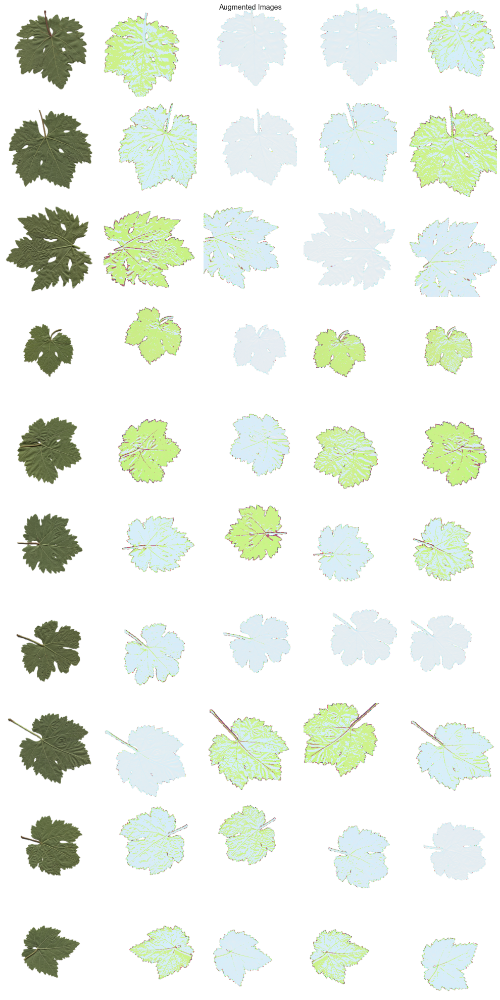

In [62]:
plot_augimages(np.random.choice(main_df['path'],10), vgg_datagen)

In [63]:
vgg19 = VGG19(include_top = False, input_shape = (227,227,3), weights = 'imagenet')

# training of all the convolution is set to false
for layer in vgg19.layers:
    layer.trainable = False

x = GlobalAveragePooling2D()(vgg19.output)
predictions = Dense(5, activation='softmax')(x)

model_vgg = Model(inputs = vgg19.input, outputs = predictions)

In [64]:
model_vgg.compile(loss='categorical_crossentropy', optimizer="adam", metrics=['accuracy'])

In [65]:
history_vgg = model_vgg.fit(
      train_generator_vgg,
      validation_data=val_generator_vgg,
      epochs=50,
      verbose=2)

Epoch 1/50
13/13 - 141s - loss: 2.2222 - accuracy: 0.1775 - val_loss: 1.9096 - val_accuracy: 0.1700 - 141s/epoch - 11s/step
Epoch 2/50
13/13 - 137s - loss: 1.7809 - accuracy: 0.2325 - val_loss: 1.6028 - val_accuracy: 0.3300 - 137s/epoch - 11s/step
Epoch 3/50
13/13 - 151s - loss: 1.6046 - accuracy: 0.3200 - val_loss: 1.3651 - val_accuracy: 0.4100 - 151s/epoch - 12s/step
Epoch 4/50
13/13 - 134s - loss: 1.3403 - accuracy: 0.4375 - val_loss: 1.2546 - val_accuracy: 0.4600 - 134s/epoch - 10s/step
Epoch 5/50
13/13 - 132s - loss: 1.2213 - accuracy: 0.5000 - val_loss: 1.1743 - val_accuracy: 0.5600 - 132s/epoch - 10s/step
Epoch 6/50
13/13 - 126s - loss: 1.0921 - accuracy: 0.5675 - val_loss: 1.1991 - val_accuracy: 0.5500 - 126s/epoch - 10s/step
Epoch 7/50
13/13 - 133s - loss: 1.0581 - accuracy: 0.5725 - val_loss: 1.0211 - val_accuracy: 0.6300 - 133s/epoch - 10s/step
Epoch 8/50
13/13 - 129s - loss: 0.9466 - accuracy: 0.6500 - val_loss: 1.0122 - val_accuracy: 0.5700 - 129s/epoch - 10s/step
Epoch 9/

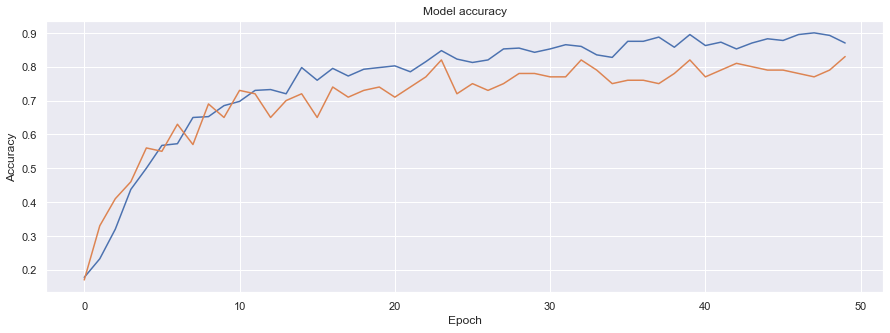

In [66]:
plt.figure(figsize=(15,5))
plt.plot(history_vgg.history['accuracy'])
plt.plot(history_vgg.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.show()

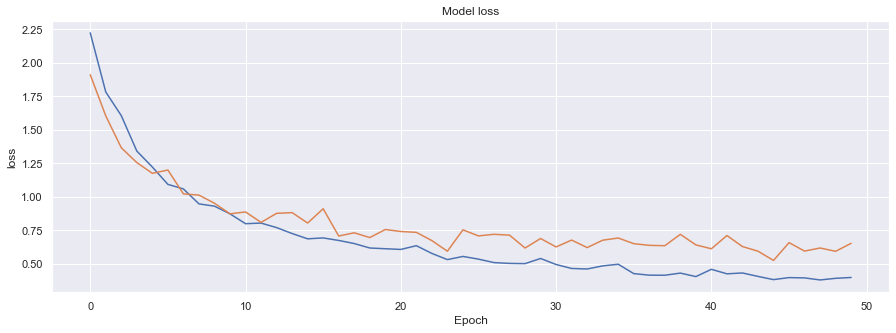

In [67]:
plt.figure(figsize=(15,5))
plt.plot(history_vgg.history['loss'])
plt.plot(history_vgg.history['val_loss'])
plt.title('Model loss')
plt.ylabel('loss')
plt.xlabel('Epoch')
plt.show()

In [68]:
dict_class = {'Ak':0, 'Ala_Idris':1, 'Buzgulu': 2, 'Dimnit': 3, 'Nazli': 4}

In [69]:
def gradcam_visualise(data, model, class_index):
    explainer = GradCAM()
    output = explainer.explain(data, model, class_index=class_index)
    return output

def activation_visualise(image, model, layers):
    explainer = ExtractActivations()
    output = explainer.explain([image], model, layers_name=layers)
    return output

In [70]:
def plot_data_four(class_name, outputs):
    fig = plt.figure(figsize=(8, 8))
    plt.suptitle(class_name)
    plt.subplot(2,2,1)
    plt.imshow(outputs[0])
    plt.subplot(2,2,2)
    plt.imshow(outputs[1])
    plt.subplot(2,2,3)
    plt.imshow(outputs[2])
    plt.subplot(2,2,4)
    plt.imshow(outputs[3])
    plt.show()

In [71]:
def grad_cam(model, df_exp, class_name, pre_process_input, class_index):
    output_data = []
    classes_df = df_exp[df_exp['classes'] ==  class_name].reset_index(drop = True)
    for idx,i in enumerate(np.random.choice(df_exp['path'],4)):
        image = cv2.imread(i)
        image = cv2.resize(image, (227,227))
        image = pre_process_input(image)
        data = ([image], None)
        output = gradcam_visualise(data, model, class_index)
        output_data.append(output)
    plot_data_four(class_name, output_data)

In [72]:
def activations_model(model, df_exp, class_name, pre_process_input, layers):
    output_data = []
    classes_df = df_exp[df_exp['classes'] ==  class_name].reset_index(drop = True)
    for idx,i in enumerate(np.random.choice(df_exp['path'],4)):
        image = cv2.imread(i)
        image = cv2.resize(image, (227,227))
        image = pre_process_input(image)
        image = tf.expand_dims(image, axis=0)
        output = activation_visualise([image], model, layers)
        output_data.append(output)
    plot_data_four(class_name, output_data)

In [73]:
from keras.applications.vgg19 import preprocess_input

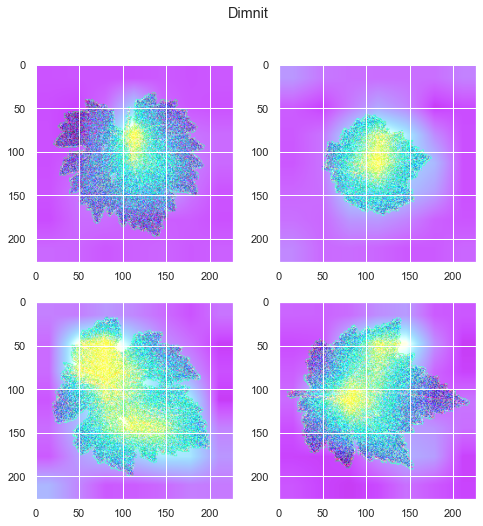

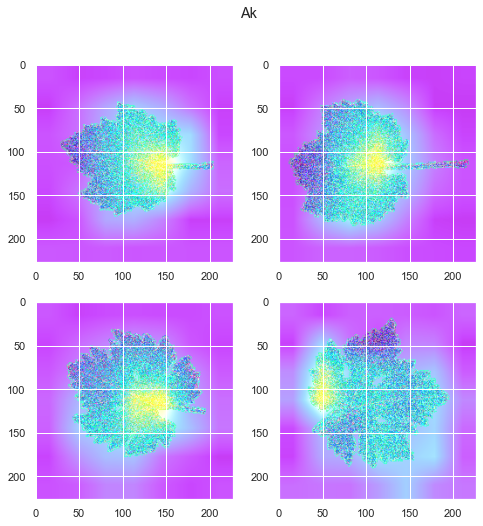

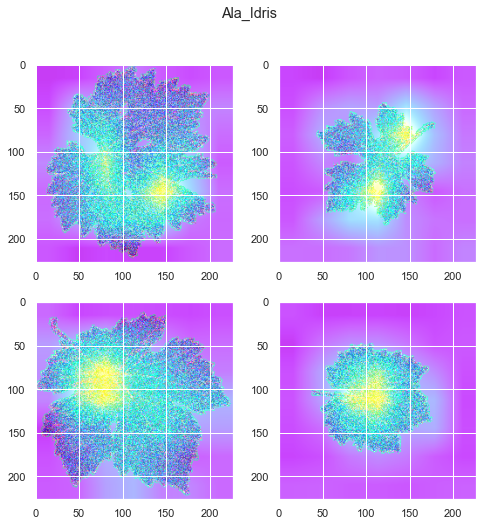

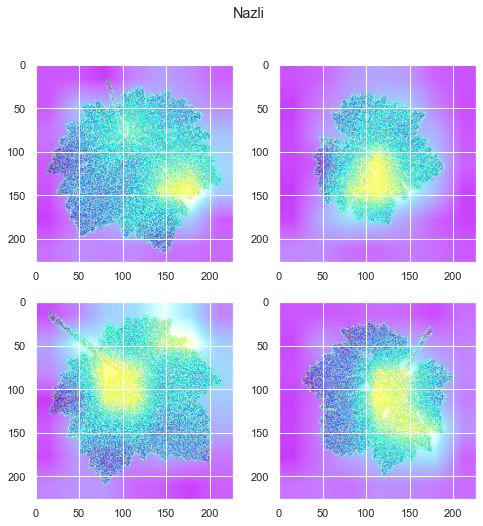

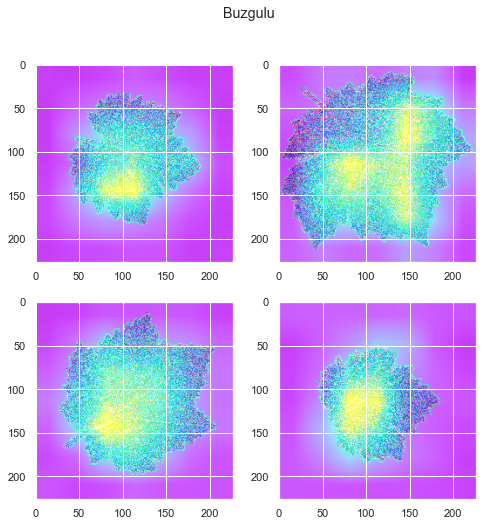

In [74]:
for class_name in X_val['classes'].unique():
    grad_cam(model_vgg, X_val, class_name, preprocess_input, dict_class[class_name])

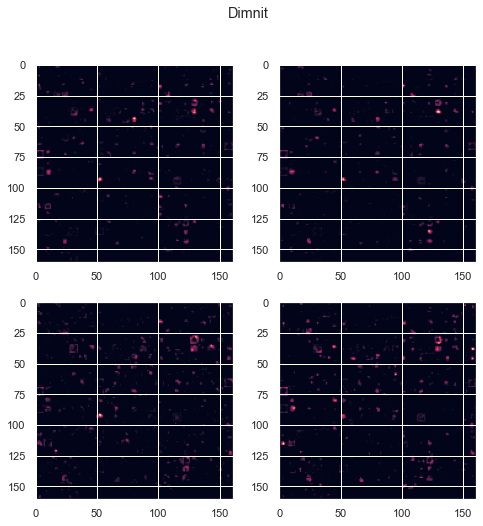

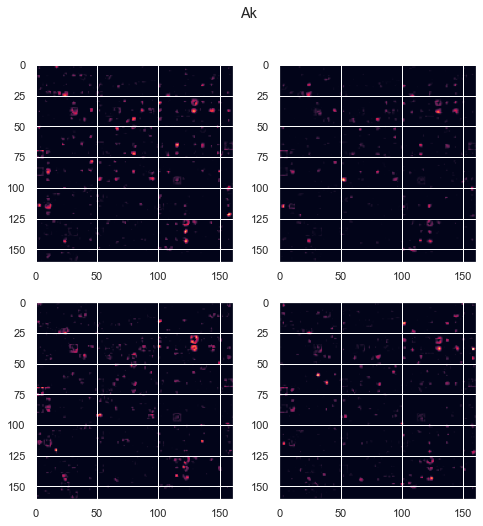

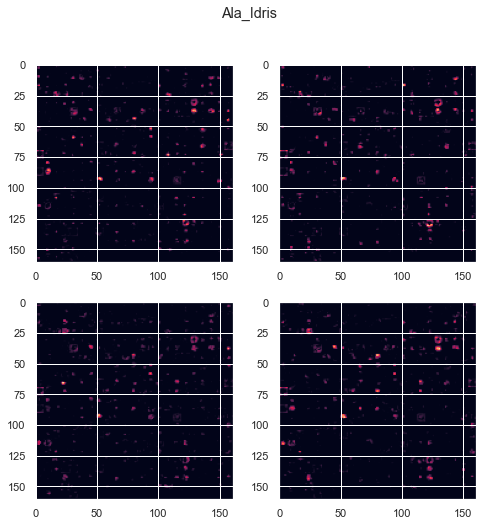

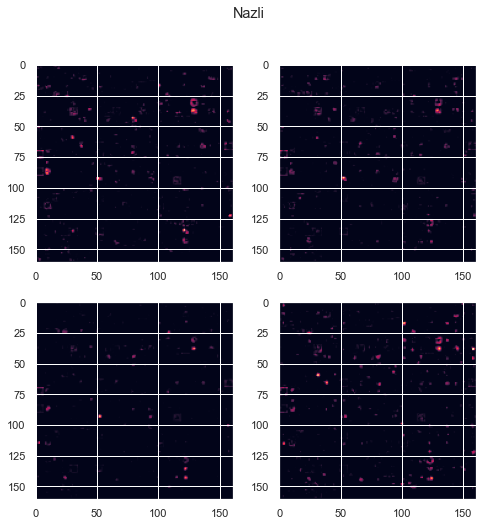

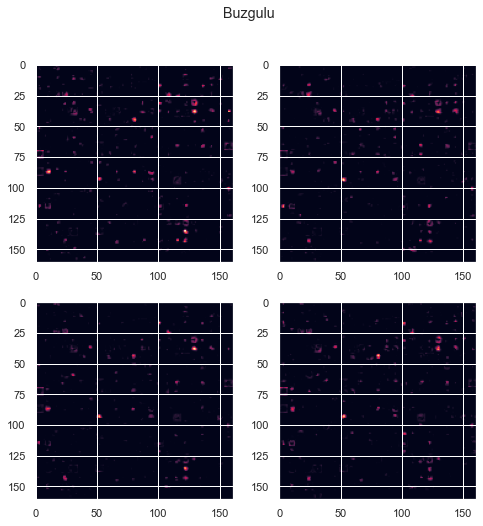

In [75]:
for class_name in X_val['classes'].unique():
    activations_model(model_vgg, X_val, class_name, preprocess_input, [model_vgg.layers[-3].name])

In [77]:
model_vgg.save('./model_vgg.h5')